<a href="https://colab.research.google.com/github/DethSaucin/advanced-machine-learning/blob/main/gtzan_model_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import numpy as np
import librosa  # for audio processing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
os.chdir("/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/genres_original")

In [ ]:
!ls

blues  classical  country  disco  hiphop  jazz	metal  pop  reggae  rock


In [ ]:
import librosa
import numpy as np
import os

def extract_mfcc(file_path, n_mfcc=13, n_fft=2048, hop_length=512):
    try:
        # Load the audio file
        audio, sample_rate = librosa.load(file_path, sr=None)
        # Compute MFCCs from the audio signal
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
        # Scale the MFCCs to have zero mean and unit variance
        mfccs_scaled = np.mean(mfccs.T, axis=0)
        return mfccs_scaled
    except Exception as e:
        print(f"Error encountered while parsing file: {file_path} - {e}")
        return None

def preprocess_dataset(data_dir):
    X = []
    y = []
    for genre in os.listdir(data_dir):
        genre_path = os.path.join(data_dir, genre)
        for file in os.listdir(genre_path):
            if not file.lower().endswith('.wav'):
                continue  # Skip any non-WAV files
            file_path = os.path.join(genre_path, file)
            # Extract MFCCs from each audio file
            mfccs = extract_mfcc(file_path)
            if mfccs is not None:
                X.append(mfccs)
                y.append(genre)
    return np.array(X), np.array(y)

# Path to the dataset
dataset_path = '/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/genres_original'

# Preprocess the dataset
X, y = preprocess_dataset(dataset_path)

# Check the shape of the features and labels
print(f'Features shape: {X.shape}')
print(f'Labels shape: {y.shape}')

Features shape: (999, 13)
Labels shape: (999,)


# Regular (Working)

In [266]:
from sklearn.preprocessing import LabelEncoder

# Instantiate the encoder
label_encoder = LabelEncoder()

# Fit the encoder and transform the labels into integers
y_encoded = label_encoder.fit_transform(y)

# The `y_encoded` now contains the genre labels as integers

In [267]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# sparse_categorical_crossentropy

In [268]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization

# Determine the number of features in your dataset
n_features = X_train.shape[1]

# Define the model architecture
model = Sequential()
# Add a fully connected layer with 256 units and ReLU activation
model.add(Dense(512, input_shape=(n_features,)))
model.add(BatchNormalization())  # Add batch normalization
model.add(Activation('relu'))    # Activation after batch normalization
model.add(Dropout(0.2))          # Add dropout for regularization
model.add(Dense(256, input_shape=(n_features,)))
model.add(BatchNormalization())  # Add batch normalization
model.add(Activation('relu'))    # Activation after batch normalization
model.add(Dropout(0.2))          # Add dropout for regularization
model.add(Dense(128, input_shape=(n_features,)))
model.add(BatchNormalization())  # Add batch normalization
model.add(Activation('relu'))    # Activation after batch normalization
model.add(Dropout(0.2))          # Add dropout for regularization
model.add(Dense(64, input_shape=(n_features,)))
model.add(BatchNormalization())  # Add batch normalization
model.add(Activation('relu'))    # Activation after batch normalization
model.add(Dropout(0.2))          # Add dropout for regularization

# Output layer with softmax activation for classification
model.add(Dense(10, activation='softmax'))  # 10 units for 10 genres

# Use SGD with momentum as an optimizer
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)

# Compile the model with the chosen optimizer
model.compile(loss='sparse_categorical_crossentropy',
# model.compile(loss='categorical_crossentropy',
              # optimizer=optimizer,
              optimizer='adam',
              metrics=['accuracy'])

# Summary of the model
model.summary()

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_267 (Dense)           (None, 512)               7168      
                                                                 
 batch_normalization_189 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 activation_201 (Activation  (None, 512)               0         
 )                                                               
                                                                 
 dropout_201 (Dropout)       (None, 512)               0         
                                                                 
 dense_268 (Dense)           (None, 256)               131328    
                                                                 
 batch_normalization_190 (B  (None, 256)             

In [269]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback to stop training at 60% accuracy
class CustomEarlyStopping(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy') > 0.60):
            print("\nReached 60% accuracy so cancelling training!")
            self.model.stop_training = True

# Instantiate the custom callback
custom_early_stopping = CustomEarlyStopping()

# Increase the number of epochs and modify batch size if necessary
history = model.fit(
    X_train,
    y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    callbacks=[custom_early_stopping],  # Add the custom callback here
    verbose=1
)

Epoch 1/100
20/20 [==============================] - 3s 19ms/step - loss: 2.2353 - accuracy: 0.2426 - val_loss: 8.1136 - val_accuracy: 0.1250
Epoch 2/100
20/20 [==============================] - 0s 8ms/step - loss: 1.7852 - accuracy: 0.3631 - val_loss: 5.2388 - val_accuracy: 0.1937
Epoch 3/100
20/20 [==============================] - 0s 9ms/step - loss: 1.6651 - accuracy: 0.4038 - val_loss: 4.0135 - val_accuracy: 0.2188
Epoch 4/100
20/20 [==============================] - 0s 8ms/step - loss: 1.6173 - accuracy: 0.4491 - val_loss: 2.8110 - val_accuracy: 0.2812
Epoch 5/100
20/20 [==============================] - 0s 8ms/step - loss: 1.5103 - accuracy: 0.4664 - val_loss: 2.0997 - val_accuracy: 0.3063
Epoch 6/100
20/20 [==============================] - 0s 8ms/step - loss: 1.4866 - accuracy: 0.4867 - val_loss: 2.0387 - val_accuracy: 0.3500
Epoch 7/100
20/20 [==============================] - 0s 8ms/step - loss: 1.4363 - accuracy: 0.5133 - val_loss: 1.8578 - val_accuracy: 0.3625
Epoch 8/100


# Graphing / Testing / Exporting

In [271]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=2)

print(f'Test accuracy: {test_accuracy}')

7/7 - 0s - loss: 1.1661 - accuracy: 0.6600 - 34ms/epoch - 5ms/step
Test accuracy: 0.6600000262260437


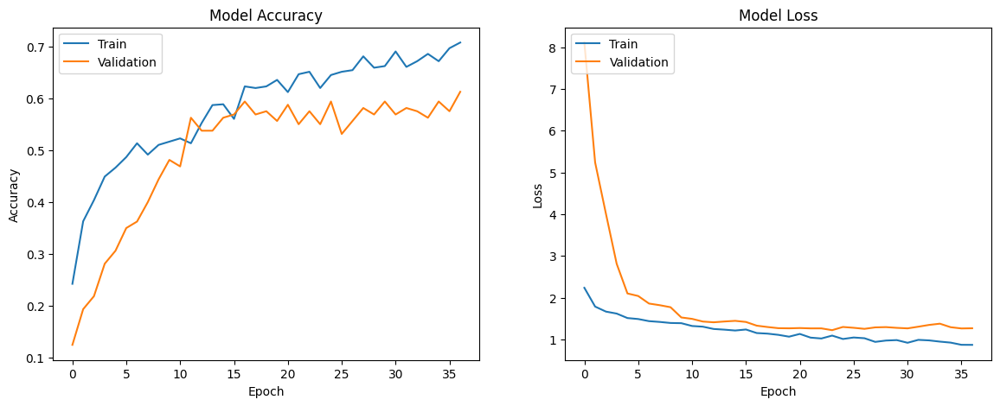

In [272]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

# Plot training accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

plt.show()

In [273]:
from sklearn.metrics import classification_report

# Make predictions on the test set
predictions = model.predict(X_test)

# Convert predictions to label indices for each sample in your test set
predicted_labels = np.argmax(predictions, axis=1)

# Get the classification report
report = classification_report(y_test, predicted_labels, target_names=label_encoder.classes_)
print(report)

7/7 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

       blues       0.81      0.81      0.81        21
   classical       0.86      1.00      0.92        12
     country       0.65      0.71      0.68        24
       disco       0.75      0.41      0.53        22
      hiphop       0.32      0.53      0.40        15
        jazz       0.76      0.70      0.73        27
       metal       0.67      1.00      0.80        18
         pop       0.70      0.84      0.76        19
      reggae       0.69      0.50      0.58        22
        rock       0.45      0.25      0.32        20

    accuracy                           0.66       200
   macro avg       0.67      0.68      0.65       200
weighted avg       0.67      0.66      0.65       200



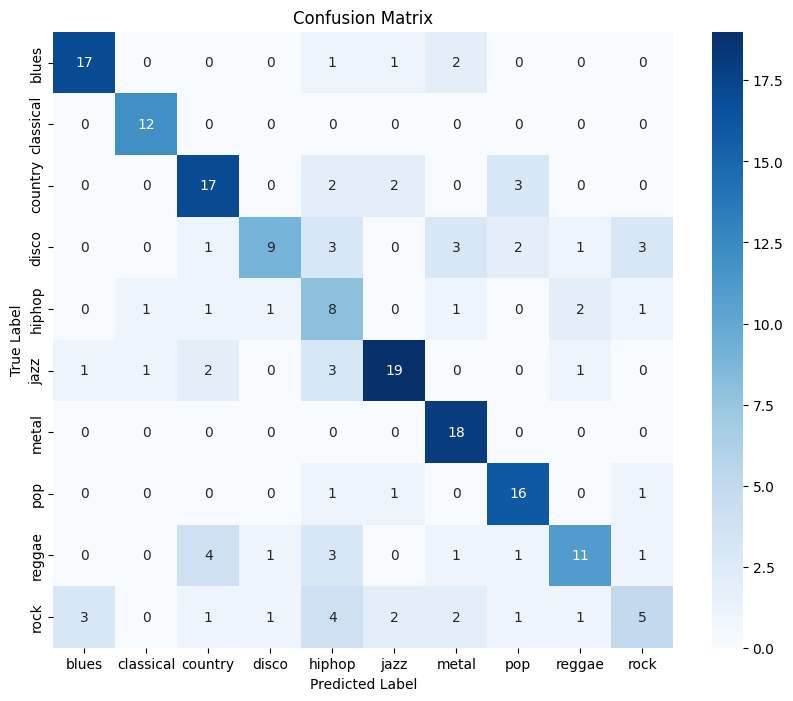

In [274]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute the confusion matrix
cm = confusion_matrix(y_test, predicted_labels)

# Plot the confusion matrix using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

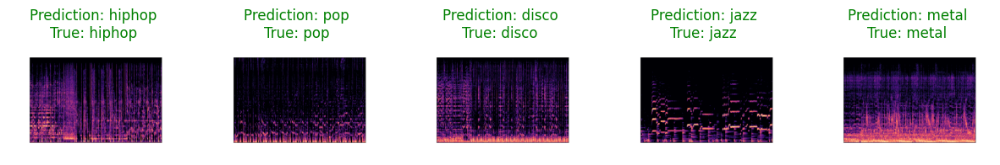

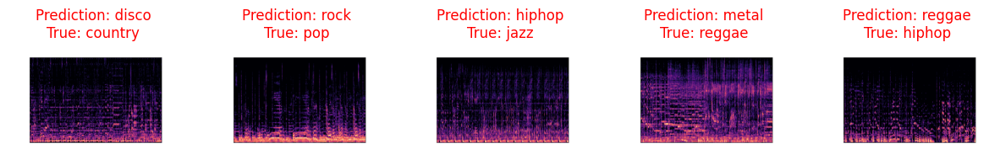

In [ ]:
import matplotlib.image as mpimg

# Define a mapping from your encoded labels back to the folder names
genre_folders = label_encoder.inverse_transform(range(len(label_encoder.classes_)))

def get_spectrogram_from_index(index, correct_label):
    # Assuming index maps directly to the file names in a sorted manner
    # You may need to adjust this logic depending on how your files are named and sorted
    genre_folder = genre_folders[correct_label]
    spectrogram_files = sorted(os.listdir(f'/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/images_original/{genre_folder}'))
    spectrogram_path = f'/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/images_original/{genre_folder}/{spectrogram_files[index]}'
    return mpimg.imread(spectrogram_path)

# Function to plot spectrograms with predictions
def plot_spectrograms(indices, is_correct):
    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(indices[:5]):  # Just show 5 examples
        if is_correct:
            correct_label = y_test[idx]
        else:
            correct_label = predicted_labels[idx]
        spectrogram = get_spectrogram_from_index(idx, correct_label)
        plt.subplot(1, 5, i + 1)
        plt.imshow(spectrogram, cmap='hot')
        title_color = 'g' if is_correct else 'r'
        plt.title(f"Prediction: {label_encoder.classes_[predicted_labels[idx]]}\nTrue: {label_encoder.classes_[y_test[idx]]}", color=title_color)
        plt.axis('off')
    plt.show()

# Show some correctly classified spectrograms
correct_indices = np.nonzero(predicted_labels == y_test)[0]
plot_spectrograms(correct_indices, is_correct=True)

# Show some incorrectly classified spectrograms
incorrect_indices = np.nonzero(predicted_labels != y_test)[0]
plot_spectrograms(incorrect_indices, is_correct=False)

In [ ]:
from IPython.display import Audio, display, HTML

# Assuming the structure and sorting of audio files are the same as the spectrograms
def get_audio_file_path_from_index(index, correct_label):
    genre_folder = genre_folders[correct_label]
    audio_files = sorted(os.listdir(f'/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/genres_original/{genre_folder}'))
    audio_file_path = f'/content/drive/My Drive/gtzan_unzipped/gtzan_unzipped/genres_original/{genre_folder}/{audio_files[index]}'
    return audio_file_path

# Function to display audio player with the prediction and actual label for given indices
def play_and_show_audio_files(indices, is_correct):
    audio_html = ""
    for i, idx in enumerate(indices[:5]):  # Only the first 5 examples
        if is_correct:
            correct_label = y_test[idx]
            predicted_label = y_test[idx]  # Correctly classified
        else:
            correct_label = y_test[idx]
            predicted_label = predicted_labels[idx]  # Incorrectly classified
        audio_file_path = get_audio_file_path_from_index(idx, correct_label)
        label_info = f"Prediction: {label_encoder.classes_[predicted_label]} | True Label: {label_encoder.classes_[correct_label]}"
        audio_player = Audio(filename=audio_file_path)
        audio_html += f"<div>{label_info}<br>{audio_player._repr_html_()}</div>"

    return audio_html

# Collect HTML for correct and incorrect predictions
correct_html = play_and_show_audio_files(correct_indices[:5], is_correct=True)
incorrect_html = play_and_show_audio_files(incorrect_indices[:5], is_correct=False)

# Combine into one HTML structure
html_structure = f"""
<div style='float: left; width: 50%;'>
    <h2>Correctly Classified</h2>
    {correct_html}
</div>
<div style='float: right; width: 50%;'>
    <h2>Incorrectly Classified</h2>
    {incorrect_html}
</div>
<div style='clear: both;'></div>
"""

# Display the HTML structure with the audio players
display(HTML(html_structure))


In [275]:
# # Save the model in the SavedModel format
model.save('/tmp/my_model')

In [ ]:
!pip install tensorflowjs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 87.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 106.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 47.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 104.6 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: keras
    Found existing installation: keras 2.14.0
    Uninstalling keras-2.14.0:
      Successfully uninstalled keras-2.14.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.14.1
    Uninstalling tensorboard-2.14.1:
      Successfully uninstal

In [276]:
!tensorflowjs_converter --input_format=tf_saved_model /tmp/my_model /tmp/tfjs_model

2023-12-12 22:59:50.534858: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-12 22:59:50.534903: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-12 22:59:50.536311: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-12 22:59:51.497410: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-12 22:59:53.668726: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the gui

In [277]:
import os
import shutil
from google.colab import files

# Zip the converted model directory for easy download
shutil.make_archive('/tmp/tfjs_model', 'zip', '/tmp/tfjs_model')

# Download the zipped file
files.download('/tmp/tfjs_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>